Satellite Image Data Analysis using numpy

Data Source: Satellite Image from WIFIRE Project

WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.

In [1]:
# Loading the libraries we need: numpy, scipy, matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import misc

%matplotlib inline

In [25]:
# Lets choose a WIFIRE satellite image file as an ndarray and display its type.

from skimage import data
import imageio
photo_data = imageio.imread('sd-3layers.jpg') # Read an image from a file as an array.

type(photo_data)

imageio.core.util.Array

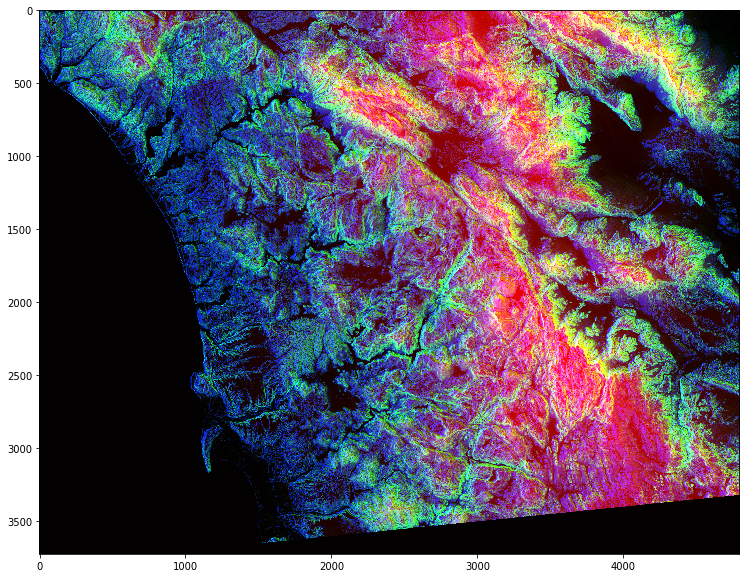

In [6]:
# Let's see what is in this image.

plt.figure(figsize=(14,10)) 
plt.imshow(photo_data); 

In [7]:
# dimension of shape
photo_data.shape

(3725, 4797, 3)

3725 is the height, width is 4797, and it has 3 layers for RGB.

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

RGB Color Mapping in the Photo:

* RED pixel indicates Altitude

* BLUE pixel indicates Aspect

* GREEN pixel indicates Slope

</ul>
The higher values denote higher altitude, aspect and slope.

In [8]:
# check it's size
photo_data.size

53606475

In [9]:
# check the maximum and minimum of the data values 
photo_data.min(), photo_data.max()

(0, 255)

In [10]:
# Check the average pixel value
photo_data.mean()

75.8299354508947

In [11]:
# Check Pixel for RGB values on the 150th Row and 250th Column 
photo_data[150,250] #檢查這位置的RGB values, 得到結果為R= 17, G = 35, B= 255

Array([ 17,  35, 255], dtype=uint8)

In [12]:
photo_data[150,250,1] 

35

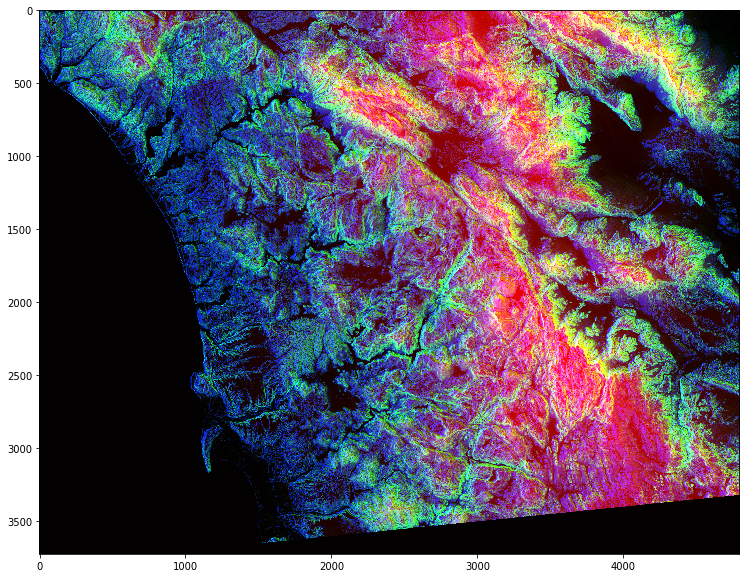

In [26]:
# Set a Pixel to All Zeros - We can set all three layer in a pixel as once by assigning zero globally to that (row,column)
# pairing. However, setting one pixel to zero is not noticeable.

plt.figure(figsize=(14,10))
plt.imshow(photo_data);

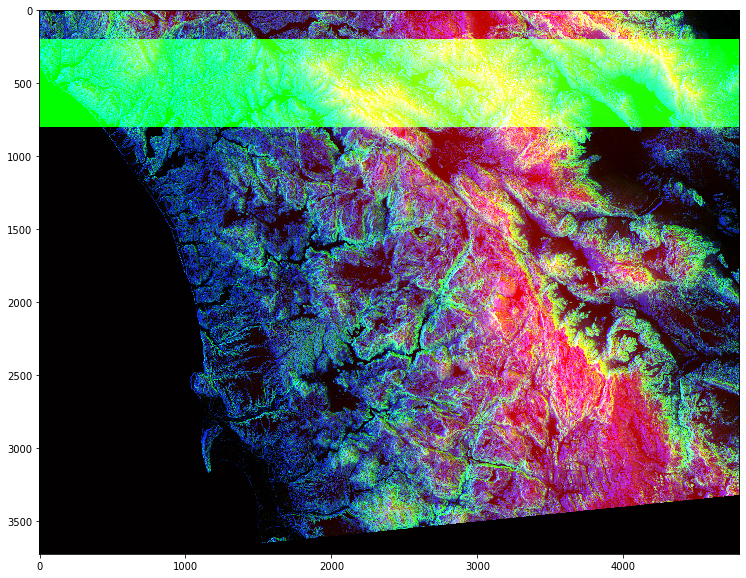

In [27]:
# Changing colors in a Range - We can also use a range to change the pixel values. E.g. let's set the green layer 
# for rows 200 t0 800 to full intensity.

# We set every value from row 200 to 800 [200:800] for all the columns[ : ] to 255. And only the green layer [1]

photo_data[200:800, : , 1] = 255
plt.figure(figsize = (14,10))
plt.imshow(photo_data);

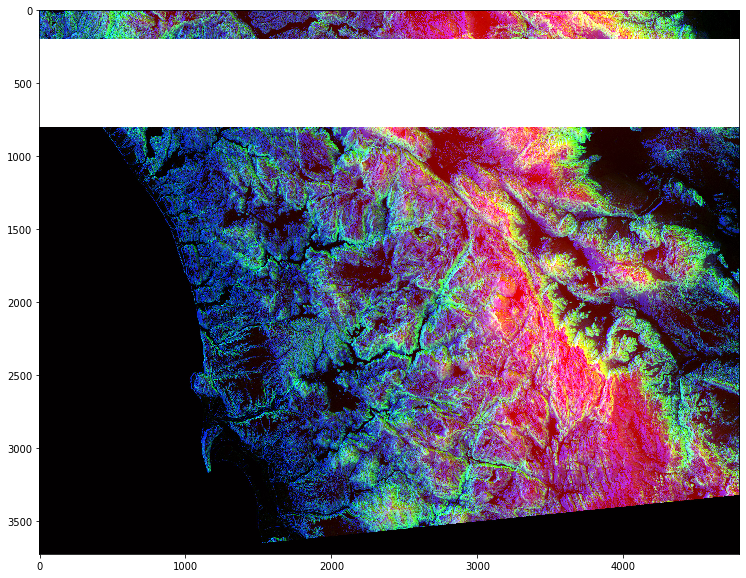

In [28]:
#All the columns in the range 200 to 800 for the rows to be full intensity (show up as white bcs three colors are 255)

photo_data[200:800, :] = 255 
plt.figure(figsize=(14,10))
plt.imshow(photo_data);

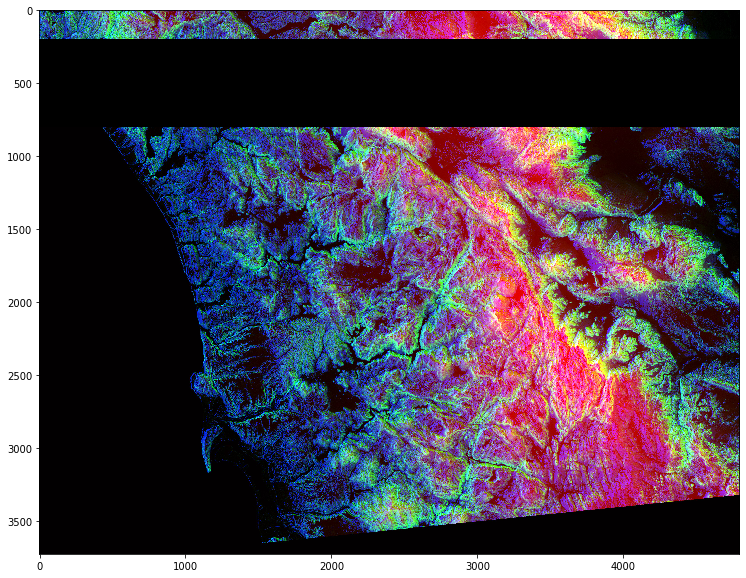

In [30]:
# All the columns in the range 200 to 800 for the rows to be full intensity (show up as black bcs three colors are 0)

photo_data[200:800, :] = 0
plt.figure(figsize=(14,10))
plt.imshow(photo_data);

In [31]:
# Pick all Pixels with Low Values

print('Shape of photo data: ', photo_data.shape)
low_value_filter = photo_data < 200 

# We use comparison to select all values that are less than 200. This will create the bullien 
# ndarray of the same shape with our original array. With low intensity we can call them points of less interest

print('Shape of low_value_filter: ', low_value_filter.shape)

Shape of photo data:  (3725, 4797, 3)
Shape of low_value_filter:  (3725, 4797, 3)


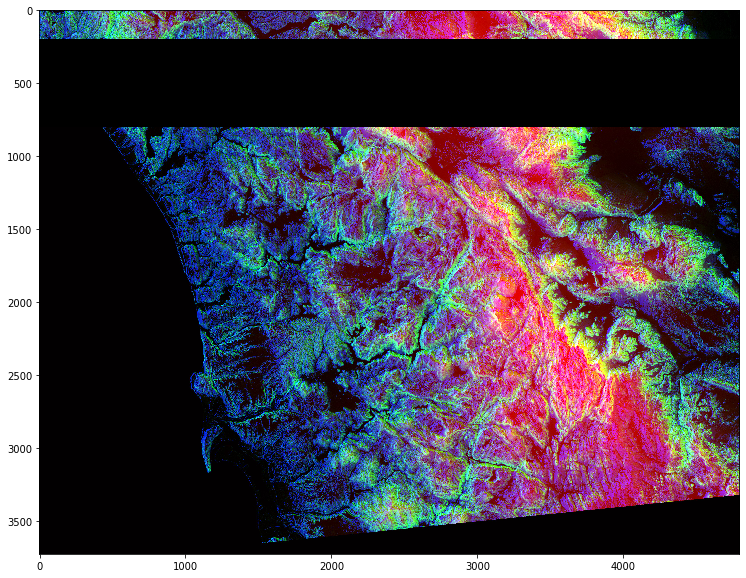

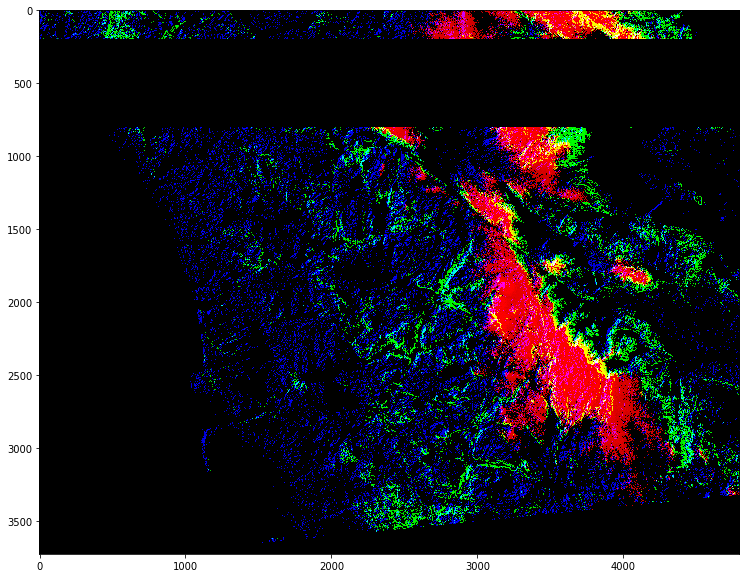

In [32]:
# Filtering Out Low Values - Whenever the low_value_filter is True, set value to 0.

plt.figure(figsize=(14,10))
plt.imshow(photo_data)

photo_data[low_value_filter] = 0 # 把low_value_filter < 200
plt.figure(figsize=(14,10))
plt.imshow(photo_data);

In [33]:
# More Row and Column Operations - You can design complex patters by making cols a function of rows or vice-versa. 
# Here we try a linear relationship between rows and columns.

rows_range = np.arange(len(photo_data)) # We create arange array called rows_range
cols_range = rows_range # We assign that same array to array called cols_range
print(type(rows_range))

<class 'numpy.ndarray'>


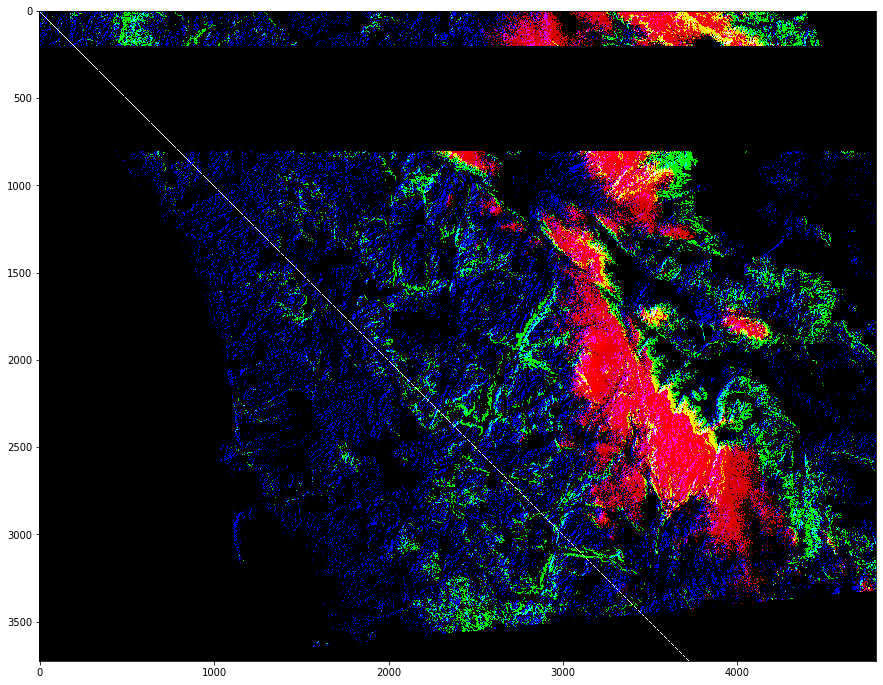

In [35]:
photo_data[rows_range, cols_range] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data);

In [36]:
# Masking Images - Now let us try something even cooler...a mask that is in shape of a circular disc.

total_rows, total_cols, total_layers = photo_data.shape
print('photo_data = ', photo_data.shape)

X, Y = np.ogrid[ :total_rows, :total_cols] 
print('X = ', X.shape, ' and Y = ', Y.shape)

photo_data =  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


In [37]:
# np.ogrid & no.mgrid examples

x, y = np.ogrid[:4, :5]

In [38]:
x

array([[0],
       [1],
       [2],
       [3]])

In [39]:
y

array([[0, 1, 2, 3, 4]])

In [40]:
x, y = np.mgrid[:4, :5]

In [41]:
x

array([[0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1],
       [2, 2, 2, 2, 2],
       [3, 3, 3, 3, 3]])

In [42]:
y

array([[0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4]])

In [43]:
# Next we will now calculate the center point x, and y
center_row, center_col = total_rows / 2, total_cols / 2
print('center_row = ', center_row, ' And center_col = ', center_col)
print()
print(X - center_row)
print()
print(Y - center_col)
print()
dist_from_center = (X - center_row)**2 + (Y- center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print()
print('Radius = ', radius)
circular_mask = (dist_from_center > radius) 
# To set all the circuler values outside of the circle to be true in circular mask
print()
print('circular mask = ', circular_mask) #n True
print()
print(circular_mask[1500:1700, 2000:2200]) # False

center_row =  1862.5  And center_col =  2398.5

[[-1862.5]
 [-1861.5]
 [-1860.5]
 ...
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]

[[-2398.5 -2397.5 -2396.5 ...  2395.5  2396.5  2397.5]]

[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]

Radius =  3468906.25

circular mask =  [[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ...

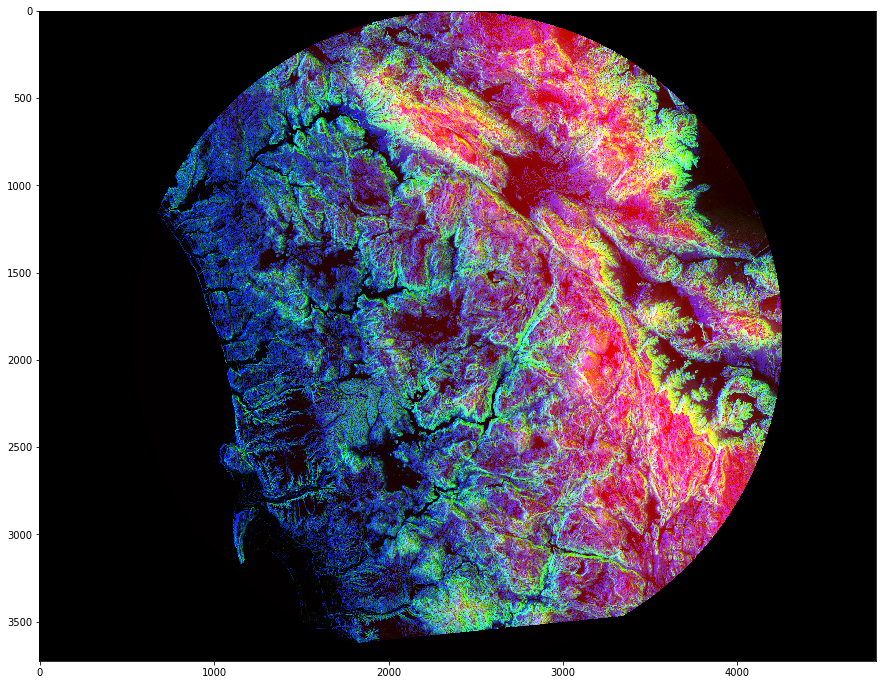

In [45]:
photo_data = imageio.imread('sd-3layers.jpg')
photo_data[circular_mask] = 0 
plt.figure(figsize = (15,15))
plt.imshow(photo_data);

In [46]:
# Further Masking - You can further improve the mask, for example just get upper half disc.

X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row 
# this line generates a mask for all rows above the center

half_upper_circular_mask = np.logical_and(half_upper, circular_mask)

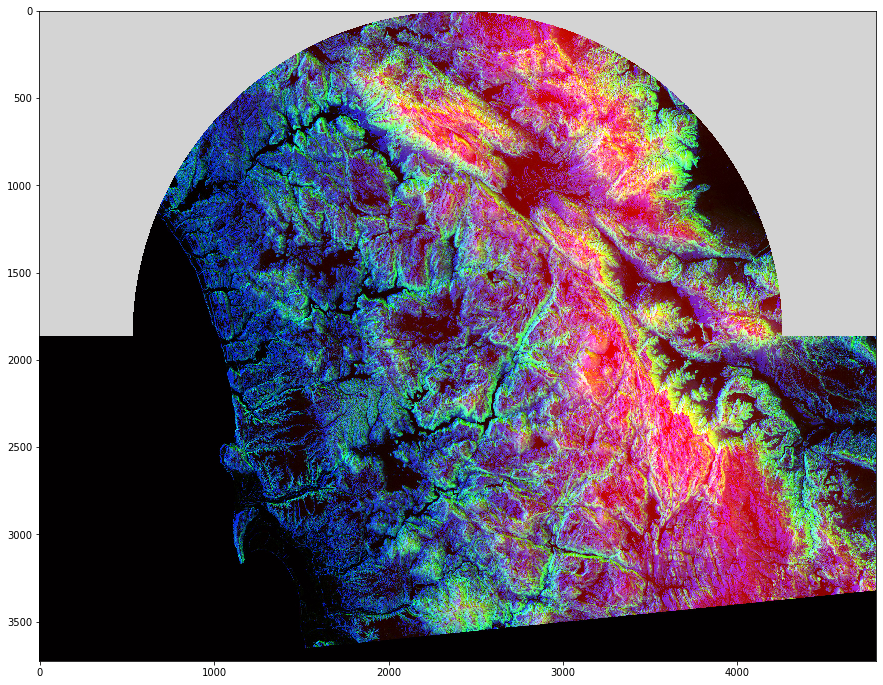

In [48]:
import random
photo_data = imageio.imread('sd-3layers.jpg')
# photo_data[half_upper_circular_mask] = 255 
photo_data[half_upper_circular_mask] = random.randint(200,255) 
plt.figure(figsize=(15,15))
plt.imshow(photo_data);

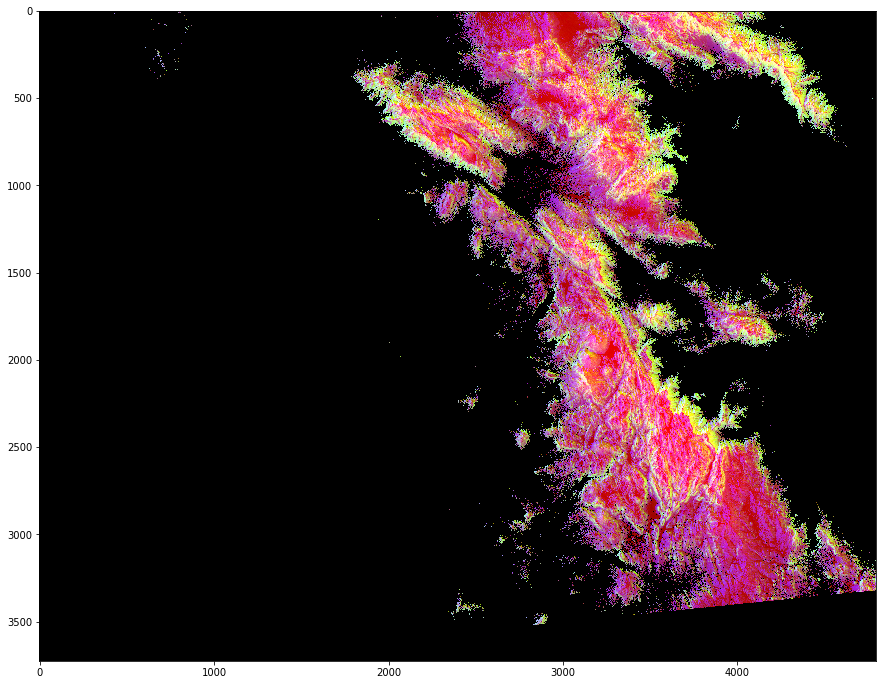

In [49]:
# Further Processing of our Satellite Imagery - Processing of RED Pixels

# Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. 
# We will do this by detecting high intensity RED Pixels and muting down other areas.

photo_data = imageio.imread('sd-3layers.jpg')
red_mask = photo_data[ : , : , 0] < 150 
# All the red values that are less than 150, the row and column index for those will be true in our red mask
photo_data[red_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data);

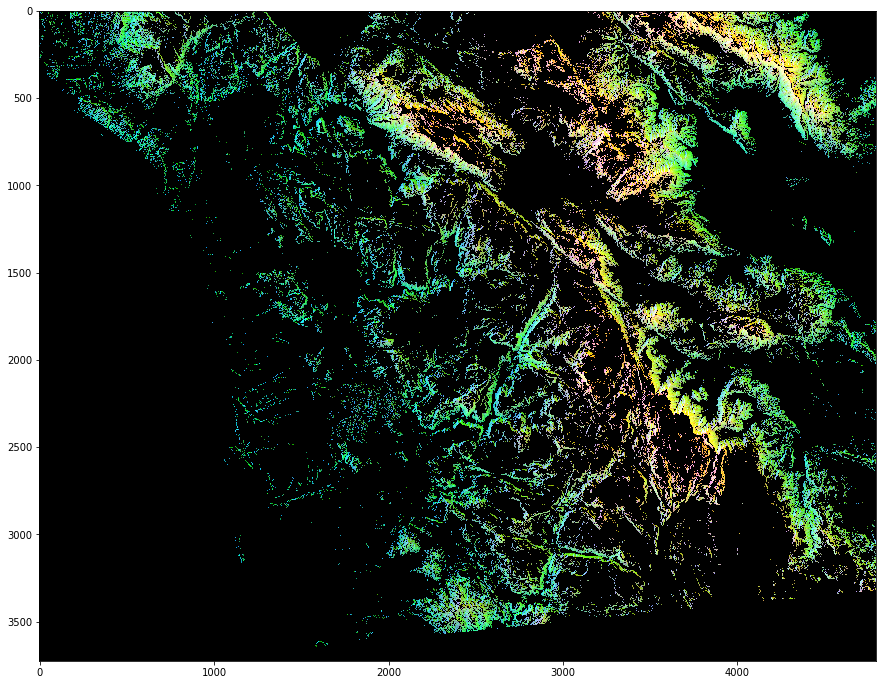

In [52]:
# We only diplay the high elevation areas that had red indensity of 150 or higher 

# Detecting Highly-GREEN Pixels

photo_data = imageio.imread('sd-3layers.jpg')
green_mask = photo_data[ : , : , 1] < 150

photo_data[green_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data);

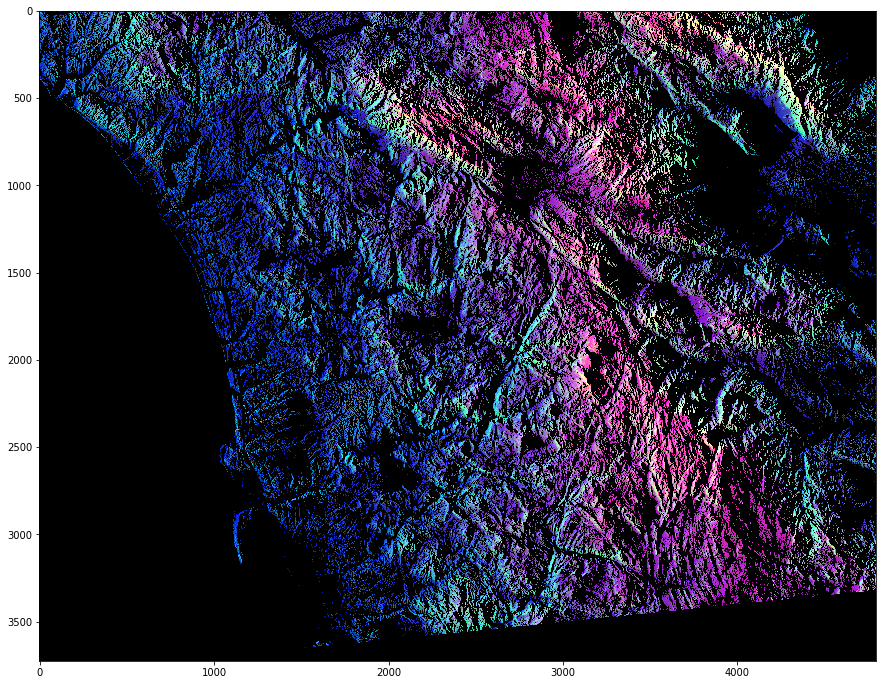

In [53]:
# Detecting Highly-BLUE Pixels

photo_data = imageio.imread('sd-3layers.jpg')
blue_mask = photo_data[ : , : , 2] < 150 

photo_data[blue_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data);

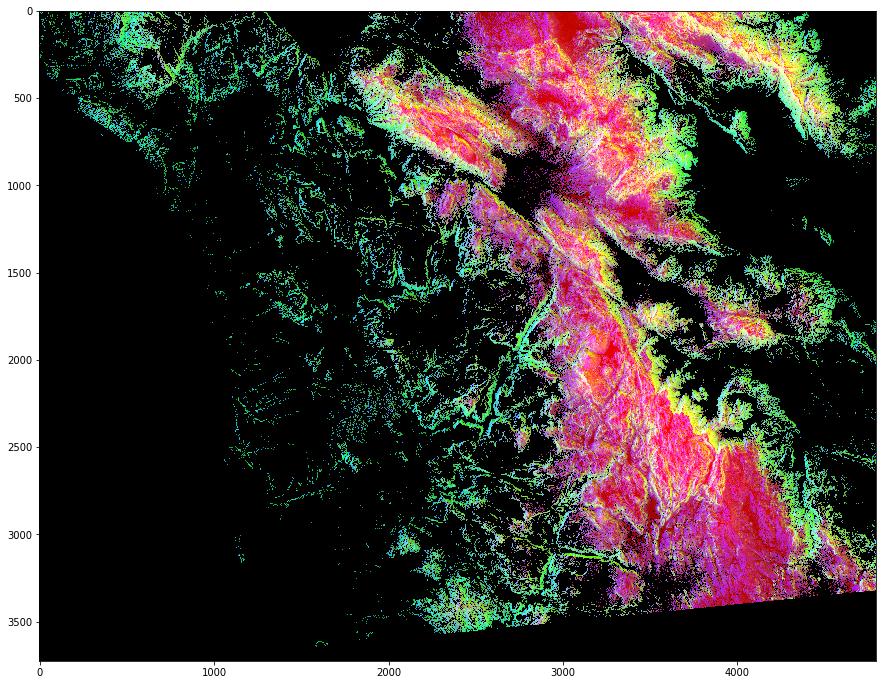

In [54]:
# Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

# Create a composite mask for point with high elevation, high aspect, and low slope using the np.logical_and
photo_data = imageio.imread('sd-3layers.jpg')

red_mask = photo_data[ : , : , 0] < 150 # filter out low elevation
green_mask = photo_data[ : , : , 1] < 150 #filter out low aspect
blue_mask = photo_data[ : , : , 2] > 150 #filter out high slope

final_mask = np.logical_and(red_mask, green_mask, blue_mask)

photo_data[final_mask] = 0 
plt.figure(figsize=(15,15))
plt.imshow(photo_data);